In [1]:
!wget --no-check-certificate "https://onedrive.live.com/download?cid=A86CBC7F31A1C06B&resid=A86CBC7F31A1C06B%21121&authkey=AMUUk0Np4tqH3n4" -O traffic.zip

--2020-08-31 07:58:29--  https://onedrive.live.com/download?cid=A86CBC7F31A1C06B&resid=A86CBC7F31A1C06B%21121&authkey=AMUUk0Np4tqH3n4
Resolving onedrive.live.com (onedrive.live.com)... 13.107.42.13
Connecting to onedrive.live.com (onedrive.live.com)|13.107.42.13|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://sblnsa.db.files.1drv.com/y4mfQS2-MrD4QR5_1b--K7m8aKXq7o5JumIFZT_qDdfOTeZw4X8dgwmMSIp-DKiDpSZKiTbfuhcg-YTWkcv3_QWYHVHj6QG7E870dNiM-SaARbykBiW5c1omVL3gH4s5v41FHluUm7cvW2_tZEpRPyaUDL5_OdmQsTERudBrdufQYhT5UFZjRG83b805zNMTflTj__lEtZNDpgfT1qFS7xgWA/ts.zip?download&psid=1 [following]
--2020-08-31 07:58:30--  https://sblnsa.db.files.1drv.com/y4mfQS2-MrD4QR5_1b--K7m8aKXq7o5JumIFZT_qDdfOTeZw4X8dgwmMSIp-DKiDpSZKiTbfuhcg-YTWkcv3_QWYHVHj6QG7E870dNiM-SaARbykBiW5c1omVL3gH4s5v41FHluUm7cvW2_tZEpRPyaUDL5_OdmQsTERudBrdufQYhT5UFZjRG83b805zNMTflTj__lEtZNDpgfT1qFS7xgWA/ts.zip?download&psid=1
Resolving sblnsa.db.files.1drv.com (sblnsa.db.files.1drv.com)... 13.107.4

In [2]:
!unzip traffic.zip

Archive:  traffic.zip
  inflating: train.txt               
   creating: ts/
  inflating: ts/00000.jpg            
  inflating: ts/00000.txt            
  inflating: ts/00001.jpg            
  inflating: ts/00001.txt            
  inflating: ts/00002.jpg            
  inflating: ts/00002.txt            
  inflating: ts/00003.jpg            
  inflating: ts/00003.txt            
  inflating: ts/00004.jpg            
  inflating: ts/00004.txt            
  inflating: ts/00005.jpg            
  inflating: ts/00005.txt            
  inflating: ts/00006.jpg            
  inflating: ts/00006.txt            
  inflating: ts/00007.jpg            
  inflating: ts/00007.txt            
  inflating: ts/00008.jpg            
  inflating: ts/00008.txt            
  inflating: ts/00009.jpg            
  inflating: ts/00009.txt            
  inflating: ts/00010.jpg            
  inflating: ts/00010.txt            
  inflating: ts/00011.jpg            
  inflating: ts/00011.txt            
  inflating

In [3]:
##Seperate jpg images inot a differnet folder
import glob
import shutil
import os

src_dir = "/content/ts/"
dst_dir =os.makedirs("/content/data/images")

for jpgfile in glob.iglob(os.path.join(src_dir, "*.jpg")):
  shutil.copy(jpgfile,"/content/data/images")


In [4]:
#Seperate txt files into different folder
dst_dir1=os.makedirs("/content/data/labels/")
for txtfile in glob.iglob(os.path.join(src_dir,"*.txt")):
  shutil.copy(txtfile,"/content/data/labels/")

In [5]:
%cd /content/data/
import os
import cv2
from xml.dom.minidom import parseString
from lxml.etree import Element, SubElement, tostring
import numpy as np
from os.path import join

## coco classes
YOLO_CLASSES = ('speed_limit','yield','mandatory','other')


## converts the normalized positions  into integer positions
def unconvert(class_id, width, height, x, y, w, h):

    xmax = int((x*width) + (w * width)/2.0)
    xmin = int((x*width) - (w * width)/2.0)
    ymax = int((y*height) + (h * height)/2.0)
    ymin = int((y*height) - (h * height)/2.0)
    class_id = int(class_id)
    return (class_id, xmin, xmax, ymin, ymax)


## path root folder
ROOT = '/content/data/'


## converts coco into xml 
def xml_transform(root, classes):  
    class_path  = join(root, 'labels')
    ids = list()
    l=os.listdir(class_path)
    
    check = '.DS_Store' in l
    if check == True:
        l.remove('.DS_Store')
        
    ids=[x.split('.')[0] for x in l]   

    annopath = join(root, 'labels', '%s.txt')
    imgpath = join(root, 'images', '%s.jpg')
    
    os.makedirs(join(root, 'xml'), exist_ok=True)
    outpath = join(root, 'xml', '%s.xml')

    for i in range(len(ids)):
        img_id = ids[i] 
        img= cv2.imread(imgpath % img_id)
        height, width, channels = img.shape # pega tamanhos e canais das images

        node_root = Element('annotation')
        node_folder = SubElement(node_root, 'folder')
        node_folder.text = 'VOC2007'
        img_name = img_id + '.jpg'
    
        node_filename = SubElement(node_root, 'filename')
        node_filename.text = img_name
        
        node_source= SubElement(node_root, 'source')
        node_database = SubElement(node_source, 'database')
        node_database.text = 'Coco database'
        
        node_size = SubElement(node_root, 'size')
        node_width = SubElement(node_size, 'width')
        node_width.text = str(width)
    
        node_height = SubElement(node_size, 'height')
        node_height.text = str(height)

        node_depth = SubElement(node_size, 'depth')
        node_depth.text = str(channels)

        node_segmented = SubElement(node_root, 'segmented')
        node_segmented.text = '0'

        target = (annopath % img_id)
        if os.path.exists(target):
            label_norm= np.loadtxt(target).reshape(-1, 5)

            for i in range(len(label_norm)):
                labels_conv = label_norm[i]
                new_label = unconvert(labels_conv[0], width, height, labels_conv[1], labels_conv[2], labels_conv[3], labels_conv[4])
                node_object = SubElement(node_root, 'object')
                node_name = SubElement(node_object, 'name')
                node_name.text = classes[new_label[0]]
                
                node_pose = SubElement(node_object, 'pose')
                node_pose.text = 'Unspecified'
                
                
                node_truncated = SubElement(node_object, 'truncated')
                node_truncated.text = '0'
                node_difficult = SubElement(node_object, 'difficult')
                node_difficult.text = '0'
                node_bndbox = SubElement(node_object, 'bndbox')
                node_xmin = SubElement(node_bndbox, 'xmin')
                node_xmin.text = str(new_label[1])
                node_ymin = SubElement(node_bndbox, 'ymin')
                node_ymin.text = str(new_label[3])
                node_xmax = SubElement(node_bndbox, 'xmax')
                node_xmax.text =  str(new_label[2])
                node_ymax = SubElement(node_bndbox, 'ymax')
                node_ymax.text = str(new_label[4])
                xml = tostring(node_root, pretty_print=True)  
                dom = parseString(xml)
        print(xml)  
        f =  open(outpath % img_id, "wb")
        #f = open(os.path.join(outpath, img_id), "w")
        #os.remove(target)
        f.write(xml)
        f.close()     
       

xml_transform(ROOT, YOLO_CLASSES)

/content/data
b'<annotation>\n  <folder>VOC2007</folder>\n  <filename>00633.jpg</filename>\n  <source>\n    <database>Coco database</database>\n  </source>\n  <size>\n    <width>1360</width>\n    <height>800</height>\n    <depth>3</depth>\n  </size>\n  <segmented>0</segmented>\n  <object>\n    <name>mandatory</name>\n    <pose>Unspecified</pose>\n    <truncated>0</truncated>\n    <difficult>0</difficult>\n    <bndbox>\n      <xmin>290</xmin>\n      <ymin>501</ymin>\n      <xmax>360</xmax>\n      <ymax>582</ymax>\n    </bndbox>\n  </object>\n</annotation>\n'
b'<annotation>\n  <folder>VOC2007</folder>\n  <filename>00013.jpg</filename>\n  <source>\n    <database>Coco database</database>\n  </source>\n  <size>\n    <width>1360</width>\n    <height>800</height>\n    <depth>3</depth>\n  </size>\n  <segmented>0</segmented>\n  <object>\n    <name>speed_limit</name>\n    <pose>Unspecified</pose>\n    <truncated>0</truncated>\n    <difficult>0</difficult>\n    <bndbox>\n      <xmin>1043</xmin>\n

In [6]:
import os
a=[]
os.chdir('/content/data/')

print(os.getcwd())

path = "outputs"
for file in os.listdir(path):
    a.append("xml/"+file)
with open("paths.txt", 'w') as output:
    for row in a:
        output.write(str(row) + '\n')

/content/data


In [8]:
# with open('/content/classes.names','w') as file:
shutil.copy('/content/classes.names','/content/data/labels.txt') 

'/content/data/labels.txt'

In [9]:
import os
import argparse
import json
import xml.etree.ElementTree as ET
from typing import Dict, List
from tqdm import tqdm
import re


def get_label2id(labels_path: str) -> Dict[str, int]:
    """id is 1 start"""
    with open(labels_path, 'r') as f:
        labels_str = f.read().split()
    labels_ids = list(range(1, len(labels_str)+1))
    return dict(zip(labels_str, labels_ids))


def get_annpaths(ann_dir_path: str = None,
                 ann_ids_path: str = None,
                 ext: str = '',
                 annpaths_list_path: str = None) -> List[str]:
    # If use annotation paths list
    if annpaths_list_path is not None:
        with open(annpaths_list_path, 'r') as f:
            ann_paths = f.read().split()
        return ann_paths

    # If use annotaion ids list
    ext_with_dot = '.' + ext if ext != '' else ''
    with open(ann_ids_path, 'r') as f:
        ann_ids = f.read().split()
    ann_paths = [os.path.join(ann_dir_path, aid+ext_with_dot) for aid in ann_ids]
    return ann_paths


def get_image_info(annotation_root, extract_num_from_imgid=True):
    path = annotation_root.findtext('path')
    if path is None:
        filename = annotation_root.findtext('filename')
    else:
        filename = os.path.basename(path)
    img_name = os.path.basename(filename)
    img_id = os.path.splitext(img_name)[0]
    if extract_num_from_imgid and isinstance(img_id, str):
        img_id = int(re.findall(r'\d+', img_id)[0])

    size = annotation_root.find('size')
    width = int(size.findtext('width'))
    height = int(size.findtext('height'))

    image_info = {
        'file_name': filename,
        'height': height,
        'width': width,
        'id': img_id
    }
    return image_info


def get_coco_annotation_from_obj(obj, label2id):
    label = obj.findtext('name')
    assert label in label2id, f"Error: {label} is not in label2id !"
    category_id = label2id[label]
    bndbox = obj.find('bndbox')
    xmin = int(bndbox.findtext('xmin')) - 1
    ymin = int(bndbox.findtext('ymin')) - 1
    xmax = int(bndbox.findtext('xmax'))
    ymax = int(bndbox.findtext('ymax'))
    assert xmax > xmin and ymax > ymin, f"Box size error !: (xmin, ymin, xmax, ymax): {xmin, ymin, xmax, ymax}"
    o_width = xmax - xmin
    o_height = ymax - ymin
    ann = {
        'area': o_width * o_height,
        'iscrowd': 0,
        'bbox': [xmin, ymin, o_width, o_height],
        'category_id': category_id,
        'ignore': 0,
        'segmentation': []  # This script is not for segmentation
    }
    return ann


def convert_xmls_to_cocojson(annotation_paths: List[str],
                             label2id: Dict[str, int],
                             output_jsonpath: str,
                             extract_num_from_imgid: bool = True):
    output_json_dict = {
        "images": [],
        "type": "instances",
        "annotations": [],
        "categories": []
    }
    bnd_id = 1  # START_BOUNDING_BOX_ID, TODO input as args ?
    print('Start converting !')
    for a_path in tqdm(annotation_paths):
        # Read annotation xml
        ann_tree = ET.parse(a_path)
        ann_root = ann_tree.getroot()

        img_info = get_image_info(annotation_root=ann_root,
                                  extract_num_from_imgid=extract_num_from_imgid)
        img_id = img_info['id']
        output_json_dict['images'].append(img_info)

        for obj in ann_root.findall('object'):
            ann = get_coco_annotation_from_obj(obj=obj, label2id=label2id)
            ann.update({'image_id': img_id, 'id': bnd_id})
            output_json_dict['annotations'].append(ann)
            bnd_id = bnd_id + 1

    for label, label_id in label2id.items():
        category_info = {'supercategory': 'none', 'id': label_id, 'name': label}
        output_json_dict['categories'].append(category_info)

    with open(output_jsonpath, 'w') as f:
        output_json = json.dumps(output_json_dict)
        f.write(output_json)


def main():

    labels = "labels.txt"
    ann_dir = "xml"
    ann_ids = None
    ann_paths_list = "paths.txt"
    ext = "xml"
    output = "output.json"
    
    label2id = get_label2id(labels_path=labels)
    ann_paths = get_annpaths(
        ann_dir_path=ann_dir,
        ann_ids_path=ann_ids,
        ext=ext,
        annpaths_list_path=ann_paths_list
    )
    
    convert_xmls_to_cocojson(
        annotation_paths=ann_paths,
        label2id=label2id,
        output_jsonpath=output,
        extract_num_from_imgid=True
    )


if __name__ == '__main__':
    main()

100%|██████████| 741/741 [00:00<00:00, 9750.58it/s]

Start converting !


In [10]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.version

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.6.0+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.7.0+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-btmn158b
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-btmn158b
     |████████████████████████████████| 276kB 9.7MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2-cp36-none-any.whl size=47718 sha256=bf40f2b571fce43a585d11dddebf46036f1764a673f038003ff5a50411fcc540
  Stored in directory: /tmp/pip-ephem-wheel-cache-l_p088iv/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=838d589bef685bd92f8c2ee1e5a53b6986427d3802fc85a9cc1208c3f99c34c3
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully

<module 'torch.version' from '/usr/local/lib/python3.6/dist-packages/torch/version.py'>

In [11]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 6633 (delta 2), reused 8 (delta 2), pack-reused 6616
Receiving objects: 100% (6633/6633), 3.18 MiB | 6.04 MiB/s, done.
Resolving deltas: 100% (4682/4682), done.
Obtaining file:///content/data/detectron2_repo
     |████████████████████████████████| 2.2MB 6.8MB/s 
  Created wheel for pycocotools: filename=pycocotools-2.0.2-cp36-cp36m-linux_x86_64.whl size=266497 sha256=4b650a2c68933a1e337b1ab7a3c06e8acdd7ced3839ca56362e4dbcd1e1371ac
  Stored in directory: /root/.cache/pip/wheels/68/a5/e7/56401832f23d0b2db351c5b682e466cb4841960b086da65e4e
Successfully built pycocotools
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0
  Found

In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("traffic_dataset", {}, "/content/data/output.json", "/content/data/images")
bats_metadata = MetadataCatalog.get("traffic_dataset")
dataset_dicts = DatasetCatalog.get("traffic_dataset")

[08/31 08:21:23 d2.data.datasets.coco]: Loaded 741 images in COCO format from /content/data/output.json


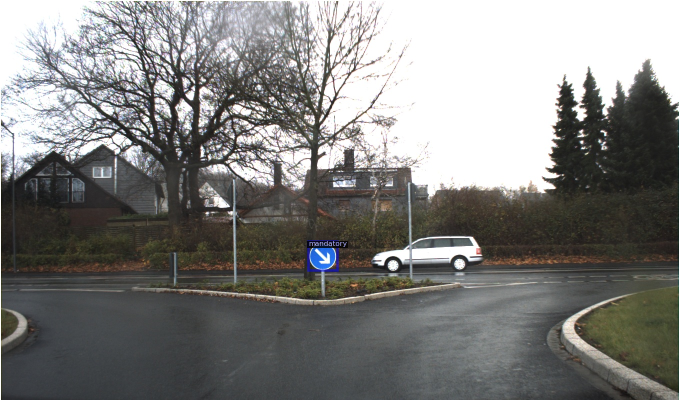

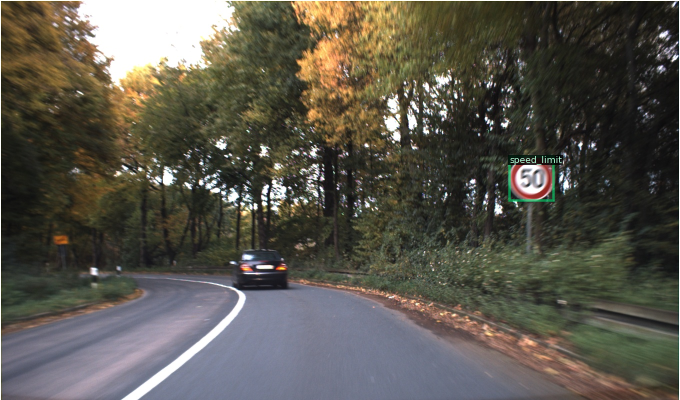

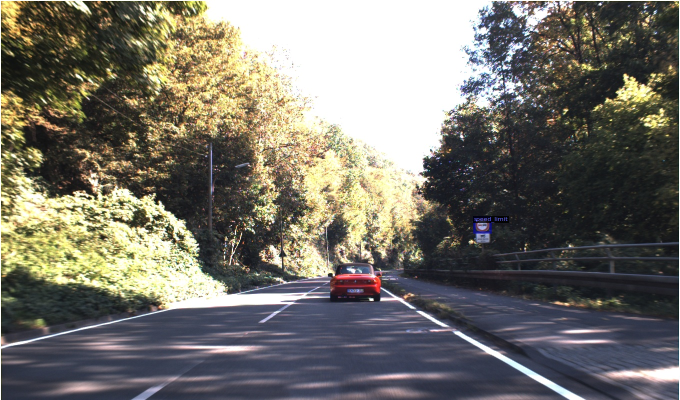

In [3]:
import random
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=bats_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [4]:
import os
from detectron2.engine import DefaultTrainer
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("traffic_dataset",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")   # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.01  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # only has one class (ball)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/31 08:24:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:15, 10.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.


[08/31 08:25:08 d2.engine.train_loop]: Starting training from iteration 0


/content/data/detectron2_repo/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[08/31 08:25:37 d2.utils.events]:  eta: 0:11:51  iter: 19  total_loss: 1.649  loss_cls: 1.401  loss_box_reg: 0.258  loss_rpn_cls: 0.02931  loss_rpn_loc: 0.01089  time: 1.4273  data_time: 0.0202  lr: 0.00019981  max_mem: 2732M
[08/31 08:26:05 d2.utils.events]:  eta: 0:11:04  iter: 39  total_loss: 0.9324  loss_cls: 0.4775  loss_box_reg: 0.4302  loss_rpn_cls: 0.026  loss_rpn_loc: 0.005667  time: 1.4216  data_time: 0.0060  lr: 0.00039961  max_mem: 2732M
[08/31 08:26:33 d2.utils.events]:  eta: 0:10:36  iter: 59  total_loss: 1.151  loss_cls: 0.3933  loss_box_reg: 0.7064  loss_rpn_cls: 0.01841  loss_rpn_loc: 0.009785  time: 1.4138  data_time: 0.0061  lr: 0.00059941  max_mem: 2732M
[08/31 08:27:01 d2.utils.events]:  eta: 0:10:09  iter: 79  total_loss: 0.9666  loss_cls: 0.2879  loss_box_reg: 0.6186  loss_rpn_cls: 0.01453  loss_rpn_loc: 0.005055  time: 1.4108  data_time: 0.0066  lr: 0.00079921  max_mem: 2732M
[08/31 08:27:28 d2.utils.events]:  eta: 0:09:37  iter: 99  total_loss: 0.8508  loss_cls

In [5]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("traffic_dataset", )
predictor = DefaultPredictor(cfg)

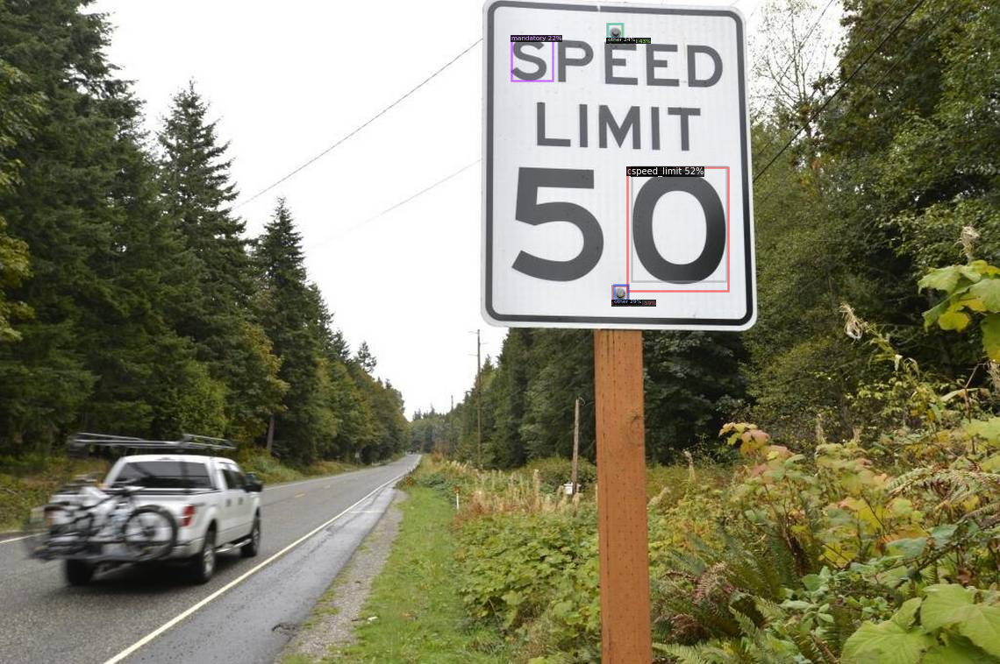

In [11]:
# Make Prediction
im = cv2.imread('/content/tr1.jpg')

outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],metadata=bats_metadata,scale=1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])